In [11]:
# pklデータの中身を確認するためのスクリプト
import pickle
import os

directory = '../../data/pkl/custom_dataset/'
filename = 'custom_dataset_val_10.pkl'

path = os.path.join(directory, filename)

# Load the pickle data
with open(path, 'rb') as f:
    data = pickle.load(f)

# Get the keypoint data
# keypoints = data['keypoint']
# keypoint_score = data['keypoint_score']

# print(len(keypoints))
# print(len(keypoints[0]))
# print(keypoints[0])
# print(keypoint_score[0])
# print(len(keypoint_score[0]))
print(data)

KeyError: 'keypoint_score'

# pklデータをアニメーション表示

フレーム枚数, キーポイント、座標軸個数= (181, 17, 2)
keypoint [[[2481.9504 1253.289 ]
  [2495.552  1239.6871]
  [2481.9504 1232.8862]
  [2522.7556 1246.488 ]
  [2536.3574 1246.488 ]
  [2543.1582 1328.0985]
  [2543.1582 1321.2976]
  [2515.9548 1450.5143]
  [2509.1538 1443.7134]
  [2434.3442 1498.1205]
  [2434.3442 1491.3196]
  [2529.5564 1538.9257]
  [2515.9548 1538.9257]
  [2427.5432 1654.5405]
  [2577.1626 1688.5449]
  [2617.9678 1824.5625]
  [2352.7336 1776.9563]]]
keypoints[:,0]= (181, 17)
keypoints[:,1]= (181, 17)
keypoints[:,0]= [[2481.9504 2495.552  2481.9504 2522.7556 2536.3574 2543.1582 2543.1582
  2515.9548 2509.1538 2434.3442 2434.3442 2529.5564 2515.9548 2427.5432
  2577.1626 2617.9678 2352.7336]
 [2467.5315 2481.1592 2467.5315 2501.6003 2515.228  2522.0417 2535.6692
  2501.6003 2487.973  2406.2078 2406.2078 2515.228  2515.228  2406.2078
  2562.9243 2617.4343 2617.4343]
 [2445.529  2458.998  2445.529  2485.9358 2506.1394 2506.1394 2506.1394
  2485.9358 2472.467  2391.6533 2398.3877 2485.9358 

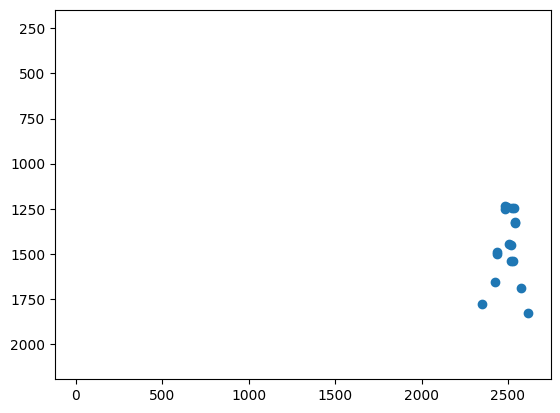

In [19]:
import numpy as np
import matplotlib.pyplot as plt
import pickle
from IPython.display import HTML
from matplotlib import animation, rc
from matplotlib.animation import ArtistAnimation
import os

directory = '../../data/pkl/train/'
filename = '2_train_1.pkl'

path = os.path.join(directory, filename)

# Load the pickle data
with open(path, 'rb') as f:
    data = pickle.load(f)

# Get the keypoint data
keypoints = data['keypoint'][0]
print('フレーム枚数, キーポイント、座標軸個数=', keypoints.shape)

# Create a figure and axes
fig, ax = plt.subplots()

# Create a scatterplot within the figure
scat = ax.scatter(keypoints[:,:,0], keypoints[:,:,1])
# print('keypoint', keypoints[:1])
# print('keypoints[:,0]=', keypoints[:,:,0].shape)
# print('keypoints[:,1]=', keypoints[:,:,1].shape)
# print('keypoints[:,0]=', keypoints[:,:,0][:5])
# print('keypoints[:,1]=', keypoints[:,:,1][:5])

# Create an animation function
def animate(i):
    scat.set_offsets(keypoints[i])
    return scat,

# Invert x and y axes
# ax.invert_xaxis()
ax.invert_yaxis()

# Create an animation
anim = animation.FuncAnimation(fig, animate, frames=len(keypoints), interval=29)
rc('animation', html='jshtml')

# Display the animation
anim

フレーム枚数, キーポイント、座標軸個数= (628, 17, 2)
len(keypoint) 628
keypoint_scores.shape (628, 17)


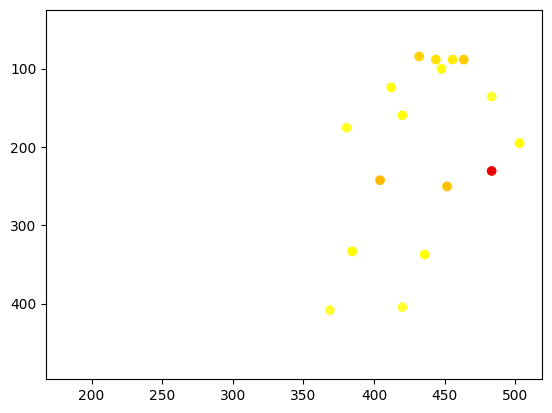

In [12]:
import os
import pickle
import matplotlib.pyplot as plt
from matplotlib import animation, rc

directory = '../../data/pkl/'
# directory = '../../rasp_cam/pkl/'
filename = 'yuiko.pkl'

# .pklを削除
base_filename = filename.replace('.pkl', '')
path = os.path.join(directory, filename)

# Load the pickle data
with open(path, 'rb') as f:
    data = pickle.load(f)

# Get the keypoint data
keypoints = data['keypoint'][0]
keypoint_scores = data['keypoint_score'][0]
# 二次元配列をフラット化
# keypoint_scores = keypoint_scores.flatten()

print('フレーム枚数, キーポイント、座標軸個数=', keypoints.shape)
print('len(keypoint)', len(keypoints))
print('keypoint_scores.shape', keypoint_scores.shape)

# Create a figure and axes
fig, ax = plt.subplots()

# Create a scatterplot within the figure
# New line: Set the color based on keypoint scores
scat = ax.scatter(keypoints[:, :, 0], keypoints[:, :, 1],
                  c=keypoint_scores, cmap=plt.cm.hot, vmin=0, vmax=1)

# Create an animation function
def animate(frame):
    scat.set_offsets(keypoints[frame])
    scat.set_array(keypoint_scores[frame])  # New line: Update the color based on keypoint scores
    return scat,

# Invert x and y axes
ax.invert_yaxis()

# Create an animation
anim = animation.FuncAnimation(fig, animate, frames=len(keypoints), interval=29)
rc('animation', html='jshtml')
# Set the filename for the saved video

# Save the animation as a video file
anim.save('anim_' + base_filename + '.mp4', writer='ffmpeg')

# Display the animation
anim

In [4]:
# アニメーションを保存
anim_file_name = os.path.splitext(filename)[0] + '.mp4'
anim.save(anim_file_name, writer='ffmpeg')